In [976]:

import numpy as np

import matplotlib.pyplot as plt
import itertools
import tensorflow as tf
import copy
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
import cvxpy as cp
import torch
import torch.nn as nn
import random
from itertools import chain
from sklearn.model_selection import train_test_split
from torchsummary import summary
import sys
import io
from cvxpylayers.torch.cvxpylayer import CvxpyLayer
import time
import torch
from torch.utils import data as torch_data
import pickle
from sklearn import preprocessing
import warnings

import torch
from torch import nn
from torch.nn import init


In [977]:

#torch.pi = torch.acos(torch.zeros(1)).item()

training_data = []
#inci_matrix = torch.tensor([ [-1,-1,-1,0,0,0,0,0],
 #  [1,0,0,-1,0,-1,0,0],
   #            [0,1,0,1,1,0,-1,0],            
  #             [0,0,1,0,-1,0,0,-1],
     #          [0,0,0,0,0,1,1,1] 
    #           ],dtype=torch.float32)

inci_matrix = pickle.load( open( "matrix_{}b{}.p".format(80,130), "rb" ) )

#print(inci_matrix)  
while len(training_data) != 4000:
  #e1p = e1 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1)) #random.randrange(1, 10, 1)#1.0#np.random.normal(0.0, 1.0, 1)[0]#random.randrange(1, 10, 1)
  #e2p = e2 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))   #random.randrange(1, 10, 1)#5.0#np.random.normal(0.0, 1.0, 1)[0]#random.randrange(1, 10, 1)
  #e3p = e3 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))  #random.randrange(1, 10, 1)#6.0#np.random.normal(0.0, 1.0, 1)[0]#random.randrange(1, 5, 1)
  #e4p = e4 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))#random.randrange(1, 10, 1)#2.0
  #e5p=e5 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))#random.randrange(1, 10, 1)#2.0
  #e6p=e6 = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))  #random.randrange(1, 10, 1)#1.0
  #e7p=e7  = float(random.uniform(0.001, 1))#float(random.randrange(1, 10, 1))  #random.randrange(1, 10, 1)#2.0
  #e8  = float(random.uniform(0.001, 1))
  z = [float(random.uniform(0.001, 1)) for i in range(130)]
  training_data.append(z)
  
#training_data = torch.stack(training_data)

In [978]:
def calc_violations(inc_matrix, selected_edges):
    #viol = 0
    viol_lst = []
    n,m = inc_matrix.shape
    b = np.zeros(n)
    # these are flipped to get 0 for violations, original are the opposite 
    b[0] = -1
    b[n-1] = 1
    
    batch_size, null = selected_edges.shape
    
    v_a = 0
    v_b = 0
    
    for i in selected_edges:
      #torch.unsqueeze(i,1)
      #print(i.shape)
      viol = 0
      
      a = torch.matmul(inc_matrix,i)
      #print(a.shape)
     # print(a.shape)
      #print(b.shape)
      c = a - b 
      for values in c:
        viol += torch.abs(values) 
        v_a += torch.abs(values) 
      
      
      
      for j in i:
        if j < 0:
          viol += torch.abs(j)
          v_b += torch.abs(j)
        elif j > 1:
          viol += torch.abs(j-1)
          v_b += torch.abs(j-1)
      viol_lst.append(viol)
      
    #print(viol_lst)
      
    return  max(viol_lst), sum(viol_lst)/len(viol_lst), v_a/len(viol_lst), v_b/len(viol_lst)

In [979]:
def cvx_py_solution(A, weights):
    warnings.filterwarnings('ignore')
    
    #G = nx.to_networkx_graph(matrix)
    #A = nx.incidence_matrix(G,oriented=True).toarray()
    #print(A)
    #chosen_edges = []
    eps = 0.5
    lbd = 0.7
    #batch_s, edges  = weights.shape
    #print(l,i)
    
    n,m = A.shape
    #target = torch.zeros((batch_s, edges))
    
    #print(target.shape)
    c = weights#cp.Parameter(m)
    #c = c.detach().numpy()
    b = np.zeros(n)
    b[0] = -1
    b[n-1] = 1
    
   # con = np.zeros(n)
    
    
    

    
    x = cp.Variable(shape=m)

    constr = [x>=0, x <= 1,
             A@x == b]
    
    #al = lbd*cp.abs(cp.sum(A@x - b))#lbd*cp.maximum(0.0, cp.sum(A@x - b))
    #print(al.shape)
   
    #- eps*cp.sum(cp.entr(x))
    #+ eps*cp.norm(x,p=2)
    problem  = cp.Problem(cp.Minimize(c @ x + eps*cp.norm(x,p=2) )
                          ,constr)
    #assert problem.is_dpp()
    problem.solve()
    #return x
    if problem.status not in ["infeasible", "unbounded"]:
    # Otherwise, problem.value is inf or -inf, respectively.
        print("Optimal value: %s" % problem.value)
    for variable in problem.variables():
        print("Variable %s: value %s" % (variable.name(), variable.value))
        
    return variable.value

In [980]:
x_nn = []
y_nn = []
for i in training_data:
    x_nn.append(i)
    
    y = cvx_py_solution(inci_matrix, i)
    
    y_nn.append(y)

#print("ss",cvx_py_solution(inci_matrix, training_data[0]))

Optimal value: 7.834674823755657
Variable var7687392: value [ 5.77127894e-10  3.55572518e-11  2.88777267e-13 -5.78963737e-12
 -4.63474876e-11 -3.13342647e-11  6.09541939e-11  1.37801979e-13
 -6.08567504e-11 -1.63775450e-11  1.00000000e+00  3.15470146e-11
 -2.03781968e-11  2.62259596e-10 -6.09286058e-11 -4.36663742e-11
 -4.14211638e-11  9.99999999e-01  1.35226013e-11  3.16815375e-10
  1.39891827e-13 -2.24624074e-11 -4.12770765e-11  6.16406194e-10
 -2.70977371e-11 -6.37883613e-11  1.56877159e-10  1.51600999e-10
 -1.75385637e-11 -6.36422420e-11  2.89648820e-12  1.70406358e-14
 -3.15489724e-11 -1.53324856e-11 -7.27481562e-14 -4.85375025e-11
 -4.14625232e-12  9.99999999e-01  9.99999999e-01 -1.30231828e-11
 -2.09447618e-11  2.02353178e-10  7.92838947e-11 -3.56262266e-14
  2.07319927e-10  2.65858378e-11  5.54028162e-10  2.42680049e-12
  5.77180894e-10  9.99999999e-01 -1.63461356e-11  1.05541861e-10
  1.00191346e-10  2.24287113e-11  4.97778496e-10  2.06316538e-11
  1.82606484e-10  9.02161996e-

In [981]:
x_nn = preprocessing.normalize(x_nn)
y_nn = preprocessing.normalize(y_nn)

#print(y_nn[0])
#print(x_nn[1])

In [982]:
seed_random = 9999
np.random.seed(seed_random)
x_train, x_test, y_train, y_test = train_test_split(np.array(x_nn), np.array(y_nn), test_size=0.25, train_size=0.75, random_state=seed_random, shuffle=True)
x_train, x_cv, y_train, y_cv = train_test_split(x_train, y_train, test_size=0.2, train_size=0.8, random_state=seed_random, shuffle=True)

print('shapes of train, validation, test data', x_train.shape, y_train.shape, x_cv.shape, y_cv.shape, x_test.shape, y_test.shape)

shapes of train, validation, test data (2400, 130) (2400, 130) (600, 130) (600, 130) (1000, 130) (1000, 130)


In [983]:
params = {'iterations': 2000,'batch_size': 100, 'input_size': 130, 'hidden_units_1': 300, 'hidden_units_2': 350, 'hidden_units_3': 450, 'hidden_units_4': 550, 'hidden_units_5': 550, 'hidden_units_6': 450, 'hidden_units_7': 350,'hidden_units_8': 350,  'do_1': 0.2, 'do_2': 0.1, 'do_3': 0.05, 'output_size': 130, 'lr': 0.001, 'min_lr': 1e-05, 'max_lr': 0.001, 'epochs': 30, 'lr_sched': 'clr', 'lr_sched_mode': 'triangular', 'gamma': 0.95}

In [984]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("device:", device)

trainset = torch_data.TensorDataset(torch.as_tensor(x_train, dtype=torch.float, device=device), 
torch.as_tensor(y_train, dtype=torch.float, device=device))
train_dl = torch_data.DataLoader(trainset, batch_size=params['batch_size'], drop_last=True)

val_dl = torch_data.DataLoader(torch_data.TensorDataset(torch.as_tensor(x_cv, dtype=torch.float, device=device), 
torch.as_tensor(y_cv, dtype=torch.float, device=device)), batch_size=params['batch_size'], drop_last=True)

test_dl = torch_data.DataLoader(torch_data.TensorDataset(torch.as_tensor(x_test, dtype=torch.float, device=device), 
torch.as_tensor(y_test, dtype=torch.float, device=device)), batch_size=params['batch_size'], drop_last=True)

device: cpu


In [985]:

def init_weights(net, init_type='normal', init_gain=0.02):
    #Initialize network weights.

    #Parameters:
     #   net (network)   -- network to be initialized
      #  init_type (str) -- the name of an initialization method: normal | xavier | kaiming | orthogonal
       # init_gain (float)    -- scaling factor for normal, xavier and orthogonal.

    #We use 'normal' in the original pix2pix and CycleGAN paper. But xavier and kaiming might
    #work better for some applications. Feel free to try yourself.
    

    def init_func(m):  # define the initialization function
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
            if init_type == 'normal':
                init.normal_(m.weight.data, 0.0, init_gain)
            elif init_type == 'xavier':
                init.xavier_normal_(m.weight.data, gain=init_gain)
            elif init_type == 'kaiming_uniform':
                nn.init.kaiming_uniform_(m.weight.data, mode='fan_in', nonlinearity='relu')

                #init.kaiming_uniform(m.weight.data, a=0, mode='fan_in')
                #init.kaiming_uniform(m.bias.data, a=0, mode='fan_in')
            elif init_type == 'orthogonal':
                init.orthogonal_(m.weight.data, gain=init_gain)
                #init.orthogonal_(m.bias.data, gain=init_gain)
                
            elif init_type == 'kaiming_normal':
                nn.init.kaiming_normal_(m.weight.data, mode='fan_in', nonlinearity='relu')

            
            else:
                raise NotImplementedError('initialization method [%s] is not implemented' % init_type)
            if hasattr(m, 'bias') and m.bias is not None:
                init.constant_(m.bias.data, 0.0)
        elif classname.find(
                'BatchNorm2d') != -1:  # BatchNorm Layer's weight is not a matrix; only normal distribution applies.
            init.normal_(m.weight.data, 1.0, init_gain)
            init.constant_(m.bias.data, 0.0)

    print('initialize network with %s' % init_type)
    net.apply(init_func)


In [986]:

#def diff_round(x):
 #   return  (torch.sin(2.0*3.14*x)/2.0*3.14) - x
 
def diff_rounder(x):
    differentiable_round = torch.maximum(x-torch.tensor(0.499),torch.tensor(0))
    differentiable_round = differentiable_round * torch.tensor(10000)
    differentiable_round = torch.minimum(differentiable_round, torch.tensor(1))
    return differentiable_round

def modified_deadzone_relu(x):
    k = torch.tensor(10)
    b1 = torch.tensor(-k*0.05)
    b2 = torch.tensor(-k*0.15)
    return torch.minimum(torch.tensor(1), torch.maximum(torch.tensor(0), k*x + b1)) - torch.minimum(torch.tensor(1), torch.maximum(torch.tensor(0), k*(x-0.1) + b2))

class RounD(nn.Module):
    def __init__(self):
        '''
        Init method.
        '''
        super().__init__() # init the base class

    def forward(self, input):
        '''
        Forward pass of the function.
        '''
        return diff_rounder(input)

In [987]:
torch.manual_seed(9999)
#last_activation = RounD()
def get_model():
    """
    creates a PyTorch model. Change the 'params' dict above to 
    modify the neural net configuration.
    """
    model = torch.nn.Sequential(
        torch.nn.Linear(params['input_size'], params['hidden_units_1']),
        torch.nn.BatchNorm1d(params['hidden_units_1']),
         torch.nn.Dropout(p=params['do_1']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_1'], params['hidden_units_2']),
        torch.nn.BatchNorm1d(params['hidden_units_2']),
         torch.nn.Dropout(p=params['do_2']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_2'], params['hidden_units_3']),
        torch.nn.BatchNorm1d(params['hidden_units_3']),
         torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_3'], params['hidden_units_4']),
        torch.nn.BatchNorm1d(params['hidden_units_4']),
        torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_4'], params['hidden_units_5']),
        torch.nn.BatchNorm1d(params['hidden_units_5']),
        torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_5'], params['hidden_units_6']),
        torch.nn.BatchNorm1d(params['hidden_units_6']),
        torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_6'], params['hidden_units_7']),
        torch.nn.BatchNorm1d(params['hidden_units_7']),
       torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
         torch.nn.Linear(params['hidden_units_7'], params['hidden_units_8']),
        torch.nn.BatchNorm1d(params['hidden_units_8']),
       torch.nn.Dropout(p=params['do_3']),
        torch.nn.ReLU(),
        torch.nn.Linear(params['hidden_units_8'], params['output_size']),
        torch.nn.ReLU(),
       # last_activation,
      #  torch.nn.Sigmoid(),
        # torch.nn.Softplus(),
    )
    model.to(device)
    return model

#def mse_viol(pred, target):


model = get_model()
#best_model = copy.deepcopy(model)
initialize_model = True
if initialize_model:
    init_weights(model, 'xavier')

print('model loaded into device=', next(model.parameters()).device)

# this is just to capture model summary as string
old_stdout = sys.stdout
sys.stdout = buffer = io.StringIO()

summary(model, input_size=(params['input_size'], ))

sys.stdout = old_stdout
model_summary = buffer.getvalue()
#print('model-summary\n', model_summary)
# later this 'model-summary' string can be written to tensorboard

#lr_reduce_patience = 20
#lr_reduce_factor = 0.1

loss_fn = nn.L1Loss()#nn.MSELoss()  

# optimizer = torch.optim.SGD(model.parameters(), lr=params['lr'], momentum=0.9, dampening=0, weight_decay=0, nesterov=True)
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
#optimizer = torch.optim.RMSprop(model.parameters(), lr=params['lr'], alpha=0.99, eps=1e-08, weight_decay=0, momentum=0, centered=False)

#if params['lr_sched'] == 'reduce_lr_plateau':
 #   lr_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=lr_reduce_factor, patience=lr_reduce_patience, verbose=True, threshold=0.00001, threshold_mode='rel', cooldown=0, min_lr=1e-9, eps=1e-08)
#elif params['lr_sched'] == 'clr':
#    lr_sched = torch.optim.lr_scheduler.CyclicLR(optimizer, params['min_lr'], params['max_lr'], step_size_up=8*len(train_dl), step_size_down=None, mode=params['lr_sched_mode'], last_epoch=-1, gamma=params['gamma'])

#print('lr scheduler type:', lr_sched)
#for param_group in optimizer.param_groups:
 #   print(param_group['lr'])

initialize network with xavier
model loaded into device= cpu


In [988]:
#early_stop_patience = 10
#min_val_loss = -10
#patience_counter = 0
#patience = 10

best = 10000.0
patience = 100
fails = 0
flag = False


train_losses = []
val_losses = []

l1_error = []

avg_violations = []
max_violations = []
avg_viol_v = []

l1_loss_fn = nn.L1Loss()

#train_losses_perstep = []
#val_losses_perstep = []
train_iterator = itertools.cycle(train_dl)

val_iter = itertools.cycle(val_dl)

flow_viol_lst = []
selection_viol_lst = []



for iteration in range(0, params['iterations']):
  # loop over the dataset multiple times
  
  print("------------------------------------iteration: {}".format(iteration))
  model.train()
  
  #train_iterator = itertools.cycle(train_dl)
  data = next(iter(train_iterator))
  inputs, targets  = data
  
  optimizer.zero_grad()
  
 # print("weights",inputs[0])
  
  
  prediction = model(inputs)
  
  
  max_v, avg_v , a, b = calc_violations(inci_matrix, prediction.detach())
  
  with torch.no_grad():
    l1_val = l1_loss_fn(prediction, targets)
    print("l1 weight error: ", l1_val.item())
    l1_error.append(l1_val.item())
    max_violations.append(max_v.detach().numpy())
    avg_violations.append(avg_v.detach().numpy())
    print("avg violations: {}, max violations: {}".format(avg_v, max_v))
    
      
    #a, b = calc_violations_forloss(inci_matrix, prediction)
  print("flow violations: " ,a)
  print("selection violations: " ,b)
  flow_viol_lst.append(a)
  selection_viol_lst.append(b)
  #print("prediction",prediction[0])
  #print("target",targets[0])
  #print("rounded list",list(np.flatnonzero(targets[0] > .1)))
  loss = loss_fn(prediction,targets) #+ 0.7*(a + b)
    
    
  print("loss", loss.item())  
  loss.backward()
  optimizer.step()

  #path = list(np.flatnonzero(x > .1))
  
  train_losses.append(loss.item())
  
  with torch.no_grad(): 
    model.eval()
    val_data = next(iter(val_iter))
    
    val_inputs, val_targets = val_data
      
      #with torch.no_grad():
    print("eval----------")
    linear_layer_output_val = model(val_inputs)
    max_v_, avg_v_ , a_v, b_v= calc_violations(inci_matrix, linear_layer_output_val.detach())
    avg_viol_v.append(avg_v_)
    print("validation violation ",avg_v_)
    val_loss = loss_fn(linear_layer_output_val, val_targets)# + 0.7*(a_v + b_v)
    val_losses.append(val_loss.item())
    print("eval done------")
  
  print(' train loss: {}, valid loss: {} '.format(round(loss.item(), 3), round(val_loss.item(),3)))
  
  if iteration%10==0:
    if avg_v_ < (best - 1e-5):
      print("\n UPDATE \n")
      best_model = copy.deepcopy(model)
      fails = 0
      best = avg_v_
    else:
      fails = fails + 1
    if fails > patience:
      print("Early Stopping. Valid hasn't improved for {}".format(patience))
      flag = True
    if flag:
      break
    loss = 0
    val_loss = 0
   
#bestbest_model 
print('Finished Training')




------------------------------------iteration: 0
l1 weight error:  0.030728492885828018
avg violations: 3.1299725723070786, max violations: 3.8560358295217156
flow violations:  tensor(3.1300, dtype=torch.float64)
selection violations:  0.0
loss 0.030728492885828018
eval----------
validation violation  tensor(2.0007, dtype=torch.float64)
eval done------
 train loss: 0.031, valid loss: 0.026 

 UPDATE 

------------------------------------iteration: 1
l1 weight error:  0.030638689175248146
avg violations: 3.1191691250592157, max violations: 3.6416011690162122
flow violations:  tensor(3.1192, dtype=torch.float64)
selection violations:  0.0
loss 0.030638689175248146
eval----------
validation violation  tensor(2.0011, dtype=torch.float64)
eval done------
 train loss: 0.031, valid loss: 0.026 
------------------------------------iteration: 2
l1 weight error:  0.03034769371151924
avg violations: 3.0816311342157494, max violations: 3.679919697693549
flow violations:  tensor(3.0816, dtype=torch

In [997]:
test_iter = itertools.cycle(test_dl)
test_l2 = nn.MSELoss() 
test_l1 = nn.L1Loss() 

test_viol_lst = []
test_l1_lst = []
test_l2_lst = []

i= 0
for inputs, targets in test_iter:
    
    #print(np.flatnonzero(cvx_py_solution(inci_matrix,inputs[0])> .1))
    #print(inputs[0])
    
    #print(targets[0])
    #print(np.flatnonzero(targets[0] > .1))
    #print(np.flatnonzero(model(inputs)[0] > .1))
    
  

    pred = model(inputs)
    #print(pred)
    #print(pred.shape)
    
    l2 = test_l2(pred,targets)
    #print(l2)
    test_l2_lst.append(l2)
    
    l1 = test_l1(pred,targets)
    #print(l1)
    test_l1_lst.append(l1)
    
    
    vio = calc_violations(inci_matrix,pred.detach())[1]
    test_viol_lst.append(vio)
    #print(i)
    i += 1
    if i == 5:
        break
    #print(vio)
    
   # print(calc_violations(inci_matrix,pred.detach())[1])
   
print(len(test_l2_lst))   

print("l2", sum(test_l2_lst)/len(test_l2_lst))
print("l1", sum(test_l1_lst)/len(test_l1_lst))
print("violations", sum(test_viol_lst)/len(test_viol_lst))

    
#data = next(iter(train_iterator))
#inputs, targets  = data
#best_model

5
l2 tensor(7.7406e-05, grad_fn=<DivBackward0>)
l1 tensor(0.0015, grad_fn=<DivBackward0>)
violations tensor(1.4091, dtype=torch.float64)


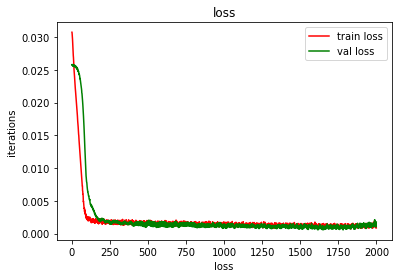

In [990]:
plt.plot(train_losses,color='r', label='train loss')
plt.plot(val_losses, color='g', label='val loss')

plt.xlabel("loss")
plt.ylabel("iterations")
plt.title("loss")

plt.legend()

plt.show()
    

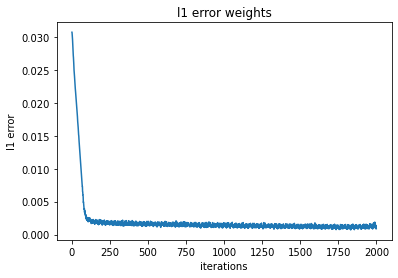

In [991]:
plt.plot(l1_error)
plt.ylabel('l1 error')
plt.xlabel('iterations')
plt.title("l1 error weights")
plt.show()

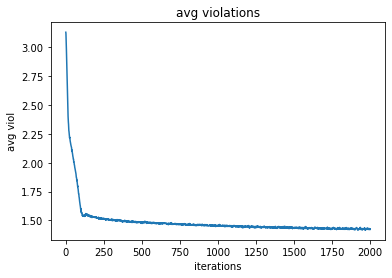

In [992]:
plt.plot(avg_violations)
plt.ylabel('avg viol')
plt.xlabel('iterations')
plt.title("avg violations")
plt.show()

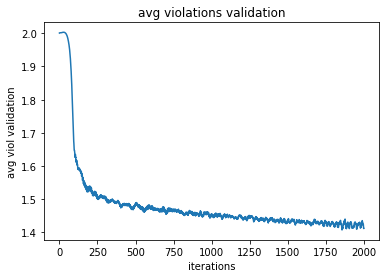

In [993]:
plt.plot(avg_viol_v)
plt.ylabel('avg viol validation')
plt.xlabel('iterations')
plt.title("avg violations validation")
plt.show()

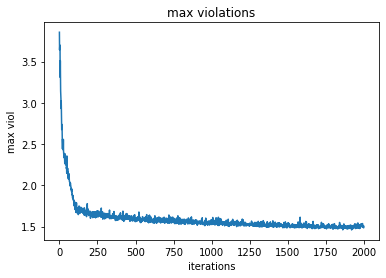

In [994]:
plt.plot(max_violations)
plt.ylabel('max viol')
plt.xlabel('iterations')
plt.title("max violations")
plt.show()

tensor(1.4179, dtype=torch.float64)


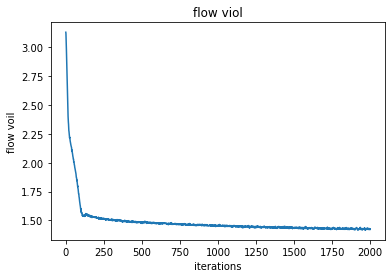

In [995]:
print(min(flow_viol_lst))
plt.plot(flow_viol_lst)
#plt.yscale('log')
plt.ylabel('flow voil')
plt.xlabel('iterations')
plt.title("flow viol")
plt.show()

In [996]:

#adict = {"selection_viol":selection_viol_lst, "flow_viol":flow_viol_lst, "max_viol":max_violations, 
 #        "avg_viol":avg_violations, "l1_error_weights":l1_error, "train_loss":train_losses,"val_loss":val_losses}
#pickle.dump( adict, open( "augmented_lag_proxy_dict.p", "wb" ) )
torch.save(best_model, './shortest_path_proxy_{}.model'.format('L1'))